# Homework: Simulate an artificial image

**Prerequisites**
- Basic statistics (covered in [this notebook](./basic_stat.ipynb))
- Knowledge about CCD, bias, dark, and flat frames.

**Goal**
- Understand the [data generating process](https://en.wikipedia.org/wiki/Data_generating_process)

**Reference**
- [Here](https://www.astropy.org/ccd-reduction-and-photometry-guide/v/dev/notebooks/01-01-astronomical-CCD-image-components.html) is a **great** tutorial on CCD data reduction. Please check out!!
- Howell, S., Handbook of CCD Astronomy, Second Ed, Cambridge University Press 2006

In [6]:
%matplotlib inline
import os
import numpy as np
from matplotlib import pyplot as plt
from utils import show_image
# fix a random number generator
np.random.seed(42)

## Start: a blank image

This is easy! We use `np.zeros` to construct an array full of zeros. We will add signals and noises as we proceed. 

<AxesSubplot:>

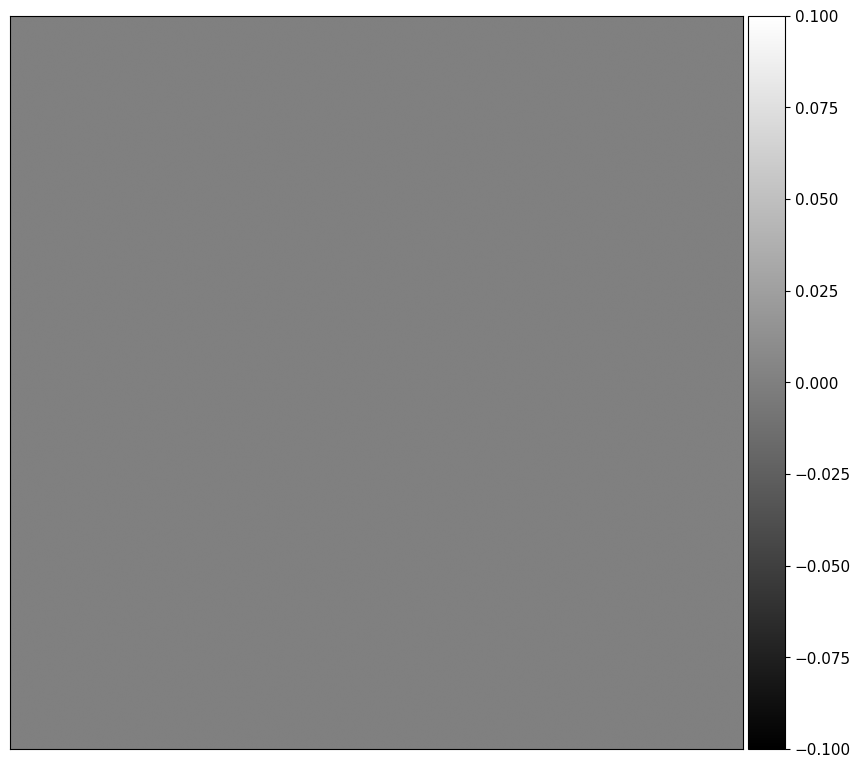

In [10]:
synthetic_image = np.zeros([1000, 1000])
show_image(synthetic_image, cmap='gray')

## Read-out noise

When we read out an image from a CCD, some small random noise is added to each pixel. This "read-out" noise follows a Gaussian distribution centered at zero. Typically you can find the "width" of this Gaussian in the CCD operating manual. For example, let's assume that the CCD manual said the read-out noise is `READ NOISE: 4e- rms` and the gain we used is `GAIN = 2 e- / ADU`. This means that the standard deviation of the read-out noise is 4 electron per read-out. Read noise of a CCD is almost always given in electrons, but images are typically in counts (ADUs). To convert electrons to counts (ADUs), we have to devide the number of electrons by gain (electrons per count). Therefore, the standard deviation of read-out noise in counts is 2. 

Below we write a function `read_noise` to generate the read-out noise to be added to the blank image that we generated above. Note that each time you run this function you'll get a different set of pixels so that it behaves like real noise.

```{margin}
Here we demonstrate how to write docstrings for a Python function. **It is always a good practice to write docstring for your code.** [Here](https://pandas.pydata.org/docs/development/contributing_docstring.html) is a nice guide to how to write good docstrings. GitHub copilot can also help you write docstrings (try it!)
```

In [41]:
def read_noise(image, amount, gain=1):
    """
    Generate simulated read noise.
    
    Parameters
    ----------
    image: numpy array
        To which we add the read noise. 
    amount : float
        The rms of read noise, in electrons.
    gain : float, optional
        Gain of the camera, in units of electrons/ADU.
        
    Returns
    -------
    noise: numpy array
        The read noise frame
    """
    shape = image.shape
    noise = np.random.normal(scale=amount / gain, size=shape)
    return noise

Text(0.5, 1.0, 'Read noise')

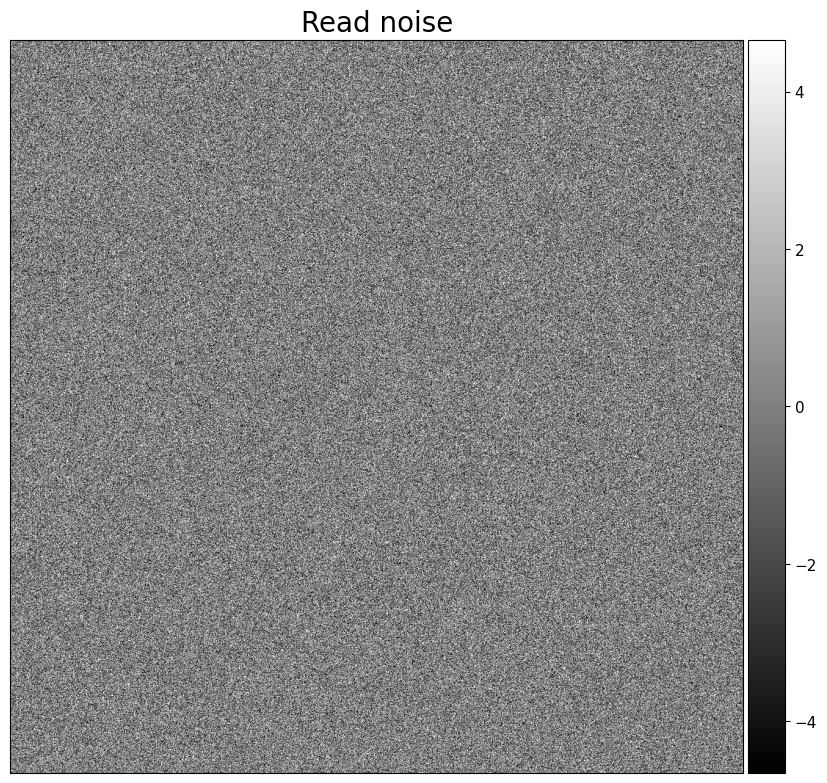

In [43]:
noise_im = synthetic_image + read_noise(synthetic_image, 4, gain=2)
fig = show_image(noise_im, cmap='gray')
fig.set_title('Read noise', fontsize='20')

##  Bias

As we have already discussed in [Calibration Frames](./calibration_frames.ipynb), bias is a positive offset added to each pixel to make sure the counts are non-negative. If there is no this offset, as we see in the above image, some pixels are negative. 

As shown in [Calibration Frames](./calibration_frames.ipynb), the bias value is roughly the same across the CCD, but there is still some spatial patterns including "bad" columns. To model such a bias, we create a uniform array and add some "bad" columns. Note that the bias is not a function of exposure time and does not have read-out noise. 

In [55]:
def bias(image, value, realistic=False):
    """
    Generate simulated bias image.
    
    Parameters
    ----------
    image: numpy array
        To which we will add the bias. 
    value: float
        Bias level to add, in counts.
    realistic : bool, optional
        If ``True``, add some "bad" columns with higher bias value
        
    Returns
    -------
    bias_im: numpy array
        The bias frame
    """
    shape = image.shape
    # This is the bias frame with the same bias value for all pixels
    bias_im = np.ones(shape) * value
    
    # Try to add "bad" columns
    if realistic:
        # We want a random-looking variation in the bias, but unlike the readnoise the bias should 
        # not change from image to image, so we make sure to always generate the same "random" numbers.
        rng = np.random.RandomState(seed=0)
        number_of_colums = rng.randint(3, 9)
        
        # Randomly select which columns are bad
        columns = rng.randint(0, shape[1], size=number_of_colums)
        
        # This will add a little random-looking noise into the data.
        # This `col_pattern` is added to the global bias value to represent "bad" columns
        col_pattern = rng.randint(0, int(0.03 * value), size=shape[0])

        for c in columns:
            # Here `c` is the index of "bad" columns
            bias_im[:, c] = value + col_pattern
            
    return bias_im        

Text(0.5, 1.0, 'Bias alone, bad columns included')

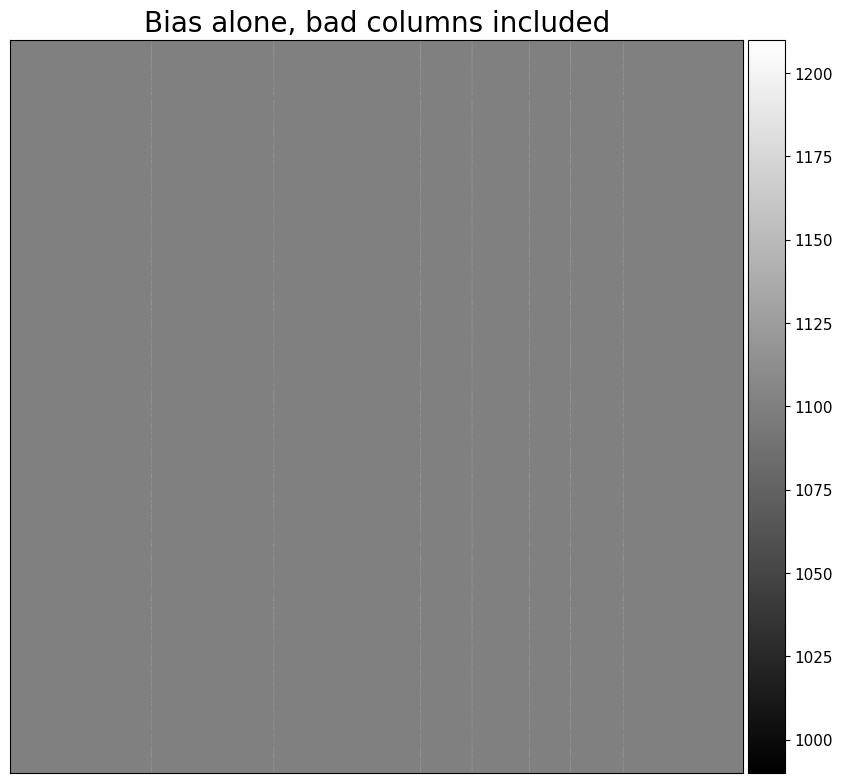

In [56]:
bias_only = bias(synthetic_image, 1100, realistic=True)
fig = show_image(bias_only, cmap='gray', figsize=(10, 10))
fig.set_title('Bias alone, bad columns included', fontsize=20)

### Now create realistic bias frame by adding bias and read noise together.

Note that we did not include any cosmic rays.

Text(0.5, 1.0, 'Realistic bias frame')

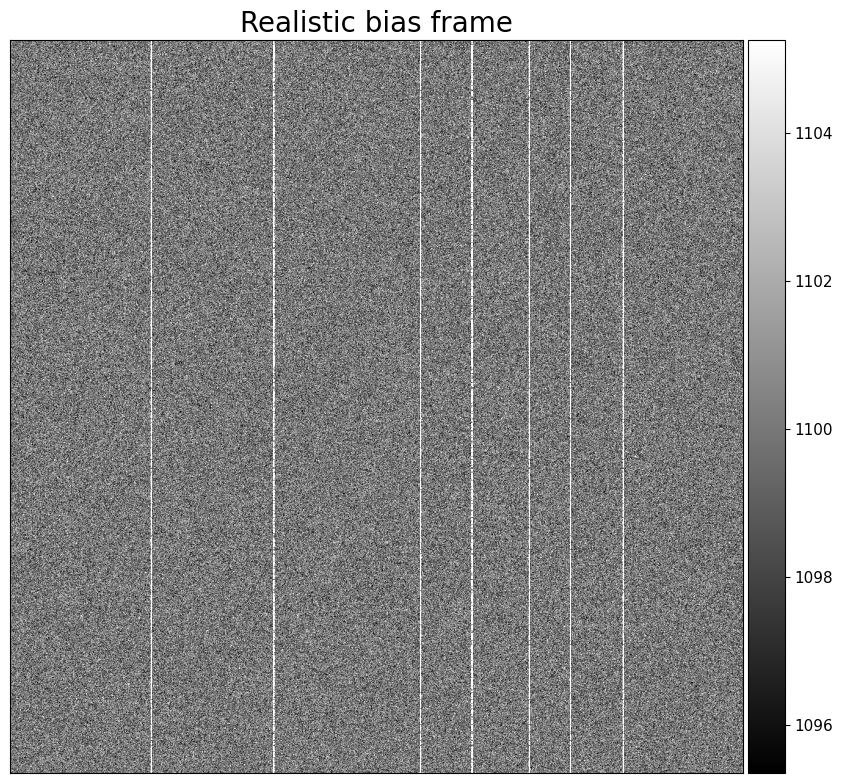

In [58]:
bias_noise_im = noise_im + bias_only
fig = show_image(bias_noise_im, cmap='gray', figsize=(10, 10))
fig.set_title('Realistic bias frame', fontsize=20)

## Dark frame

For modern cooled CCD, the dark current is typically very small (0.1 electrons/pixel/second or less). 
Dark counts in the function below are calculated by multiplying the dark current by the exposure time
after converting the dark current unit from electrons to counts using the gain. Notice that the dark counts follow a Poisson distribution. So it will look noisy. 

However, as we seen in [Calibration Frames](./calibration_frames.ipynb), some pixels as "hot" pixels. Their dark current is much larger than the other pixels. 

The function below simulates dark current only, i.e. it does *not* simulate the
read noise that is a part of any actual dark frame from a CCD.


In [64]:
def dark_current(image, current, exposure_time, gain=1.0, hot_pixels=False):
    """
    Simulate dark current in a CCD, optionally including hot pixels.
    
    Parameters
    ----------
    image : numpy array
        Image whose shape the cosmic array should match.
    current : float
        Dark current, in electrons/pixel/second, which is the way manufacturers typically 
        report it.
    exposure_time : float
        Length of the simulated exposure, in seconds.
    gain : float, optional
        Gain of the camera, in units of electrons/ADU.
    strength : float, optional
        Pixel count in the cosmic rays.
    
    Returns
    -------
    dark_im: numpy array
        The dark frame, without read noise and bias
    """
    # dark current for every pixel. Real dark counts follow 
    # a Poisson distribution with lambda = base_current.
    base_current = current * exposure_time / gain
    dark_im = np.random.poisson(base_current, size=image.shape)
    
    if hot_pixels:
        n_hot = np.random.randint(5, 50) # number of hot pixels
        y_max, x_max = dark_im.shape
        
        # For a given CCD, the positions of hot pixels are not changing. 
        # So we set a random number seed to ensure we get the same hot pixels every time. 
        rng = np.random.RandomState(seed=0)
        hot_x = rng.randint(0, x_max, size=n_hot)
        hot_y = rng.randint(0, y_max, size=n_hot)
        
        hot_current = base_current * 100 # 100 times hotter than the base dark current
        dark_im[(hot_y, hot_x)] = hot_current
    
    return dark_im

Text(0.5, 1.0, 'Dark current only, 0.1 $e^-$/sec/pix\n900 sec exposure')

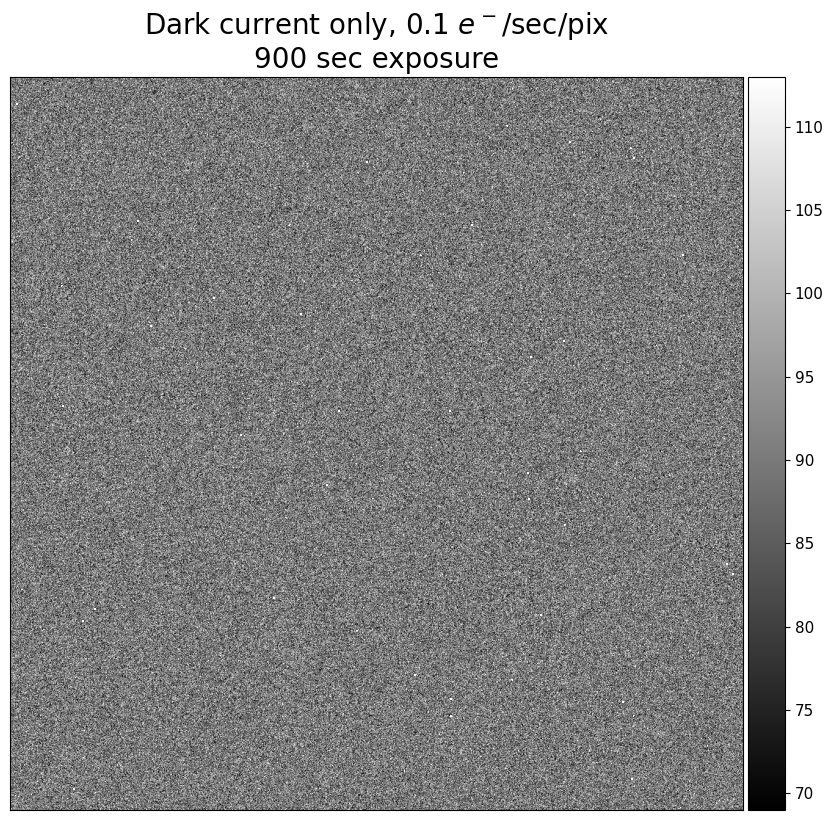

In [67]:
dark_exposure = 900
dark_cur = 0.1
dark_only = dark_current(synthetic_image, dark_cur, dark_exposure, hot_pixels=True)

fig = show_image(dark_only, cmap='gray', figsize=(10, 10))
title_string = f'Dark current only, {dark_cur} $e^-$/sec/pix\n{dark_exposure} sec exposure'
fig.set_title(title_string, fontsize=20)

Realistic dark frame is a combination of all of them: bias-only, read-out noise, and dark-only

Text(0.5, 1.0, 'Realistic dark frame \n(with bias, read noise)')

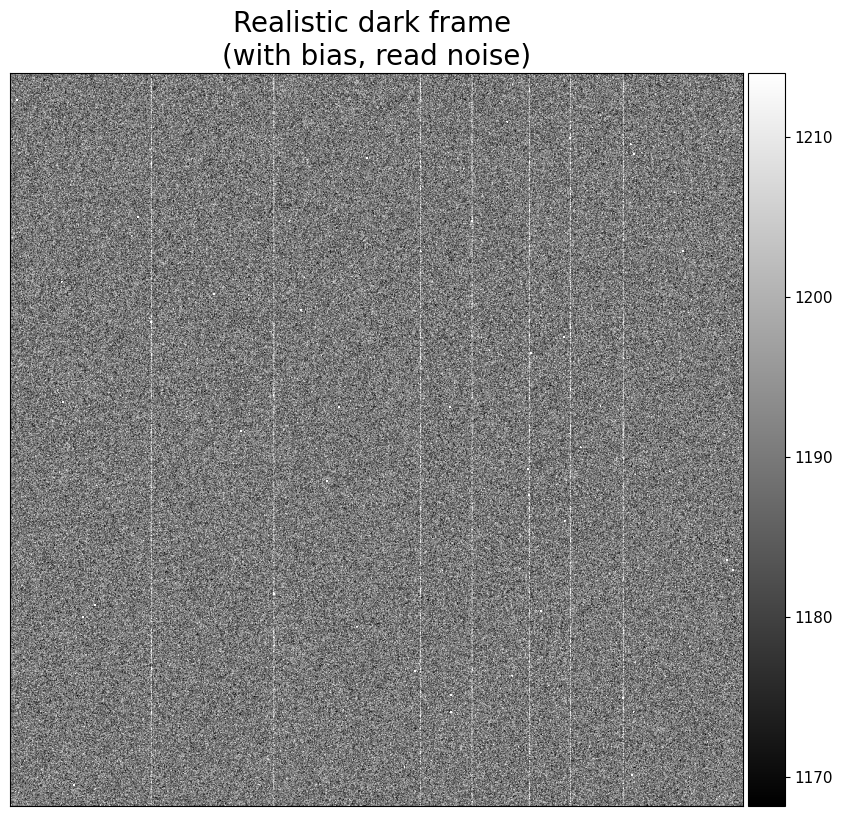

In [68]:
dark_bias_noise_im = bias_noise_im + dark_only
fig = show_image(dark_bias_noise_im, cmap='gray', figsize=(10, 10))
fig.set_title('Realistic dark frame \n(with bias, read noise)', fontsize=20)

It looks quite real! However, we did not include any cosmic rays. 

## Sky background

The amount of sky background depends on the atmospheric conditions (humidity,
presence of light clouds, fires upwind from the observatory), the light sources
in the sky (the Moon), and light sources in the surrounding area (cities). It
may be uniform across the frame or it may not be, depending on the conditions.

The function below generates some sky background. Each time you run it you'll
get slightly different results (even if you keep the desired amount of sky
counts the same) because the counts from a light source follow a Poisson
distribution.

The amount of sky background is directly proportional to the exposure time. In
the function below however, you input the desired number of sky counts.

It's not at all unusual to have a gradient in the sky across the image, but that
effect is not simulated here.

In [14]:
def sky_background(image, sky_counts, gain=1):
    """
    Generate sky background, optionally including a gradient across the image (because
    some times Moons happen).
    
    Parameters
    ----------
    
    image : numpy array
        Image whose shape the cosmic array should match.
    sky_counts : float
        The target value for the number of counts (as opposed to electrons or 
        photons) from the sky.
    gain : float, optional
        Gain of the camera, in units of electrons/ADU.
    """
    sky_im = noise_rng.poisson(sky_counts * gain, size=image.shape) / gain
    
    return sky_im

Text(0.5, 1.0, 'Sky background only, 20 counts input')

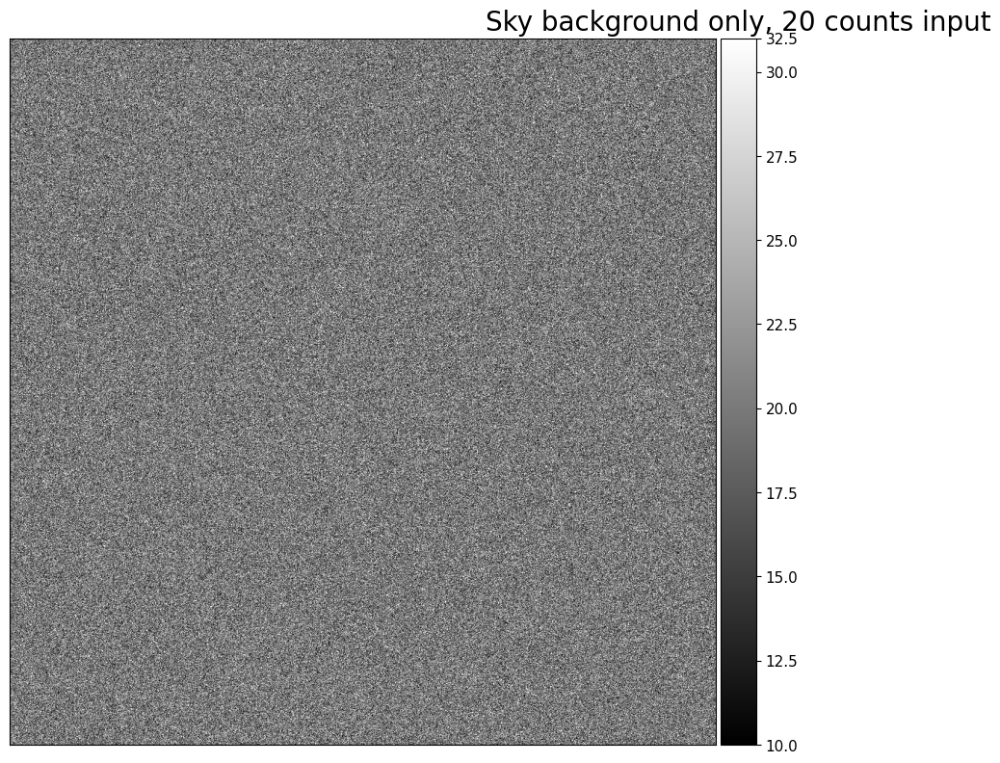

In [15]:
sky_level = 20
sky_only = sky_background(synthetic_image, sky_level)
show_image(sky_only, cmap='gray')
plt.title('Sky background only, {} counts input'.format(sky_level), fontsize=20)

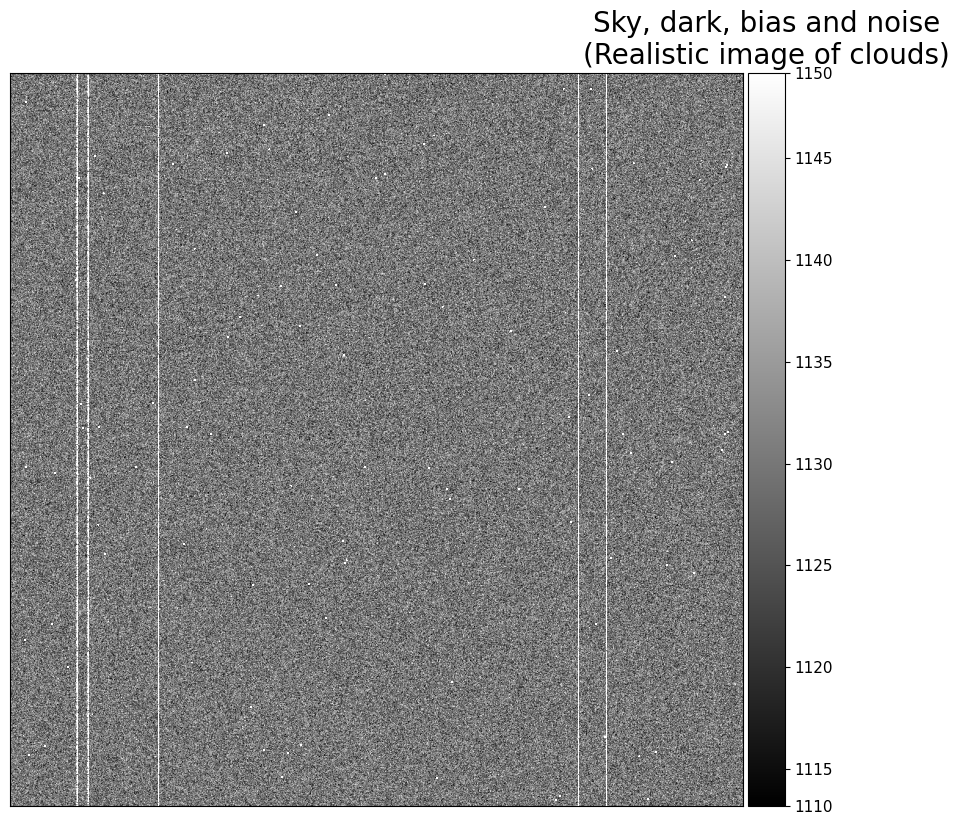

In [16]:
sky_dark_bias_noise_im = dark_bias_noise_im + sky_only
show_image(sky_dark_bias_noise_im, cmap='gray')
plt.title('Sky, dark, bias and noise\n(Realistic image of clouds)', fontsize=20);

### Summary of the backgrounds in an astronomical image

Note that the central value of the pixels in the "realistic" cloud image above,
1130 or so, is the sum of the:

+ bias level (1100 counts)
+ dark current (10 counts, which is 0.1 e/sec/pix $\times$ 100 sec, divided by
the gain of 1 e/count)
+ sky counts (20 counts)

The distribution of counts around that is determined by the read noise (5
electrons) and the expected width of a Poisson distribution for the sky counts,
which is the square root of the number of those counts, $\sqrt{20} \approx 4.5$.
Add those in quadrature and you get about 6.7.

### Interactive demo

The cell below sets up an interactive demo that lets you change the value of
read noise and other parameters to see the effect that changing them has on the
resulting image.

In [18]:
from ipywidgets import interactive, interact

# @interact(bias_level=(1000,1200,10), dark=(0.01,1,0.01), sky_counts=(0, 300, 10),
#           gain=(0.5, 3.0, 0.1), read=(0, 50, 2.0),
#           exposure=(0, 300, 10))
def complete_image(bias_level=1100, read=10.0, gain=1, dark=0.1, 
                   exposure=30, hot_pixels=True, sky_counts=200):
    synthetic_image = np.zeros([500, 500])
    show_image(synthetic_image + 
               read_noise(synthetic_image, read) +
               bias(synthetic_image, bias_level, realistic=True) + 
               dark_current(synthetic_image, dark, exposure, hot_pixels=hot_pixels) +
               sky_background(synthetic_image, sky_counts),
               cmap='gray',
               figsize=None)
    
i = interactive(complete_image, bias_level=(1000,1200,10), dark=(0.0,1,0.1), sky_counts=(0, 300, 50),
          gain=(0.5, 3.0, 0.25), read=(0, 50, 5.0),
          exposure=(0, 300, 30))

for kid in i.children:
    try:
        kid.continuous_update = False
    except KeyError:
        pass
#i

## Add some "stars"

The "stars" we'll add below are essentially just (round) Gaussian sources. The
function that does most of the work is from [photutils](https://photutils.readthedocs.io/en/stable/index.html),
which we'll return to later for doing photometry.



In [19]:
def stars(image, number, max_counts=10000, gain=1):
    """
    Add some stars to the image.
    """
    from photutils.datasets import make_random_gaussians_table, make_gaussian_sources_image
    # Most of the code below is a direct copy/paste from
    # https://photutils.readthedocs.io/en/stable/_modules/photutils/datasets/make.html#make_100gaussians_image
    
    flux_range = [max_counts/10, max_counts]
    
    y_max, x_max = image.shape
    xmean_range = [0.1 * x_max, 0.9 * x_max]
    ymean_range = [0.1 * y_max, 0.9 * y_max]
    xstddev_range = [4, 4]
    ystddev_range = [4, 4]
    params = dict([('amplitude', flux_range),
                  ('x_mean', xmean_range),
                  ('y_mean', ymean_range),
                  ('x_stddev', xstddev_range),
                  ('y_stddev', ystddev_range),
                  ('theta', [0, 2*np.pi])])

    sources = make_random_gaussians_table(number, params,
                                          seed=12345)
    
    star_im = make_gaussian_sources_image(image.shape, sources)
    
    return star_im

Text(0.5, 1.0, 'Stars only')

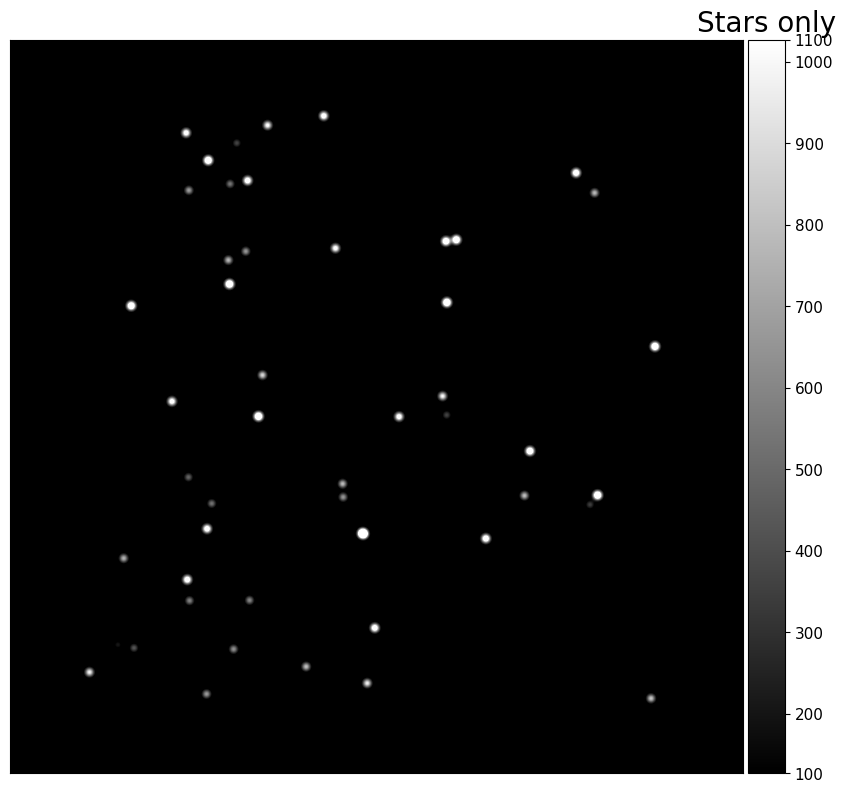

In [20]:
stars_only = stars(synthetic_image, 50, max_counts=2000)
show_image(stars_only, cmap='gray', percu=99.9)
plt.title('Stars only'.format(stars_only), fontsize=20)

In [21]:
stars_with_background = sky_dark_bias_noise_im + stars_only

Text(0.5, 1.0, 'Stars with noise, bias, dark, sky')

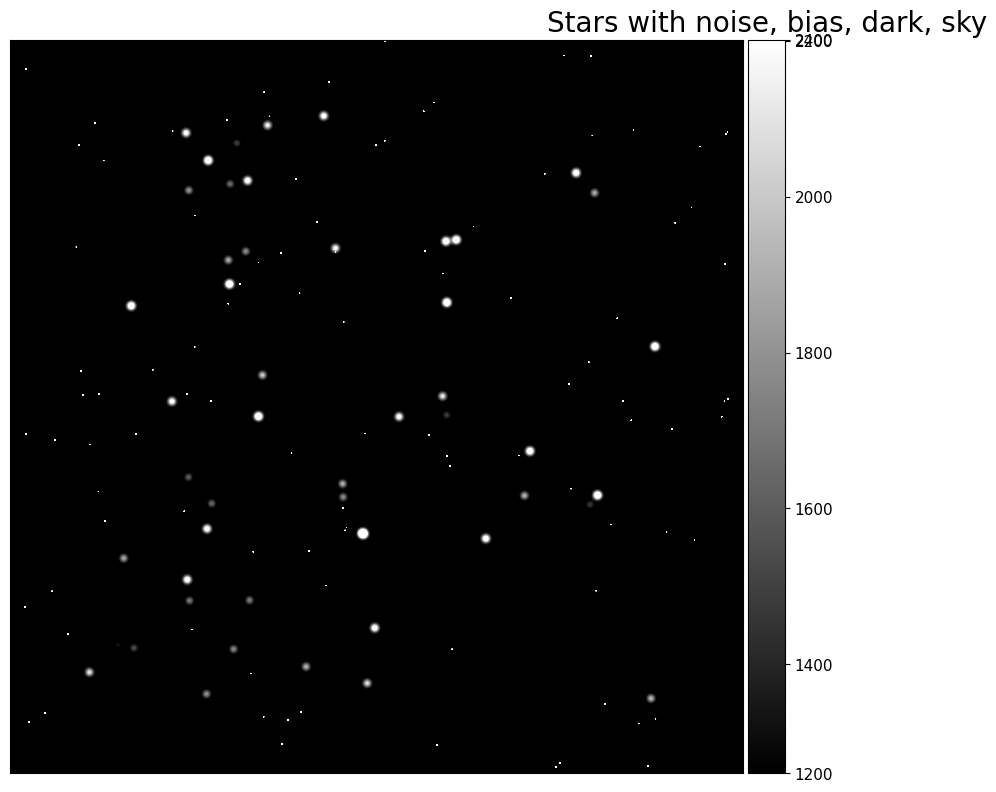

In [22]:
show_image(stars_with_background, cmap='gray', percu=99.9)
plt.title('Stars with noise, bias, dark, sky'.format(stars_with_background), fontsize=20)

### Discussion

In the image above the single-pixel bright dots are hot pixels while the
remaining dots that are larger than a pixel are simulated stars.

## Summary

Everything we have included so far has been additive. Symbolically, the
simulated image above was built like this:

$$
\text{image} = \text{bias} + \text{noise} + \text{dark current} + \text{sky} + \text{stars}
$$

Extracting the science (i.e. the stars) is in principle a matter of subtraction:

$$
\text{stars} =  \text{image} - \text{bias} - \text{noise} - \text{dark current} - \text{sky} 
$$

There are a few complications:

1. There are multiplicative effects that will be discussed in the next notebook.
2. The way to measure each of the the things we need to subtract (bias and dark
current) is to take images, each of which includes read noise. That can be
minimized by combining several calibration images.
3. There is no way to subtract the read noise because it is random.